In [155]:
## This file is part of Jax Geometry
#
# Copyright (C) 2021, Stefan Sommer (sommer@di.ku.dk)
# https://bitbucket.org/stefansommer/jaxgeometry
#
# Jax Geometry is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.
#
# Jax Geometry is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.
#
# You should have received a copy of the GNU General Public License
# along with Jax Geometry. If not, see <http://www.gnu.org/licenses/>.
#

In [156]:
#Modules

#JAX
import jax.numpy as jnp
from jax import lax

#Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

#JAXGeometry
from src.manifolds.embedded_euclidean import *
from src.plotting import *
from IPython.display import clear_output
from src.Riemannian import metric, geodesic
from src.stochastics import Brownian_coords
from src.stochastics import product_sde
from src.stochastics.product_sde import tile

#Neural Networks
import haiku as hk
import optax
import jaxopt
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np

#%matplotlib notebook

# Plane embedded into $\mathbb{R}^{3}$

In [157]:
#Defining manifold
M = Euclidean_2d_3d()
print(M)

Embedded Euclidean manifold of dimension 3


In [158]:
#Hyper parameters
x0 = M.coords([0.,0.])
max_T = 1.0
T = 0.5

metric.initialize(M)
geodesic.initialize(M)
Brownian_coords.initialize(M)

In [159]:
(product,sde_product,chart_update_product) = product_sde.initialize(M,M.sde_Brownian_coords,
                                                                    M.chart_update_Brownian_coords)

In [160]:
def get_coords(Fx):
    chart = M.centered_chart(Fx)
    return (M.invF((Fx,chart)),chart)

def to_TM(Fx,v):
    x = get_coords(Fx)
#     return jnp.dot(M.JF(x),jnp.dot(M.invJF((Fx,x[1])),v))
    JFx = M.JF(x)
    return jnp.dot(JFx,jnp.linalg.lstsq(JFx,v)[0])

## Simulate Synthetic Data

### Simulating Circle on Plane

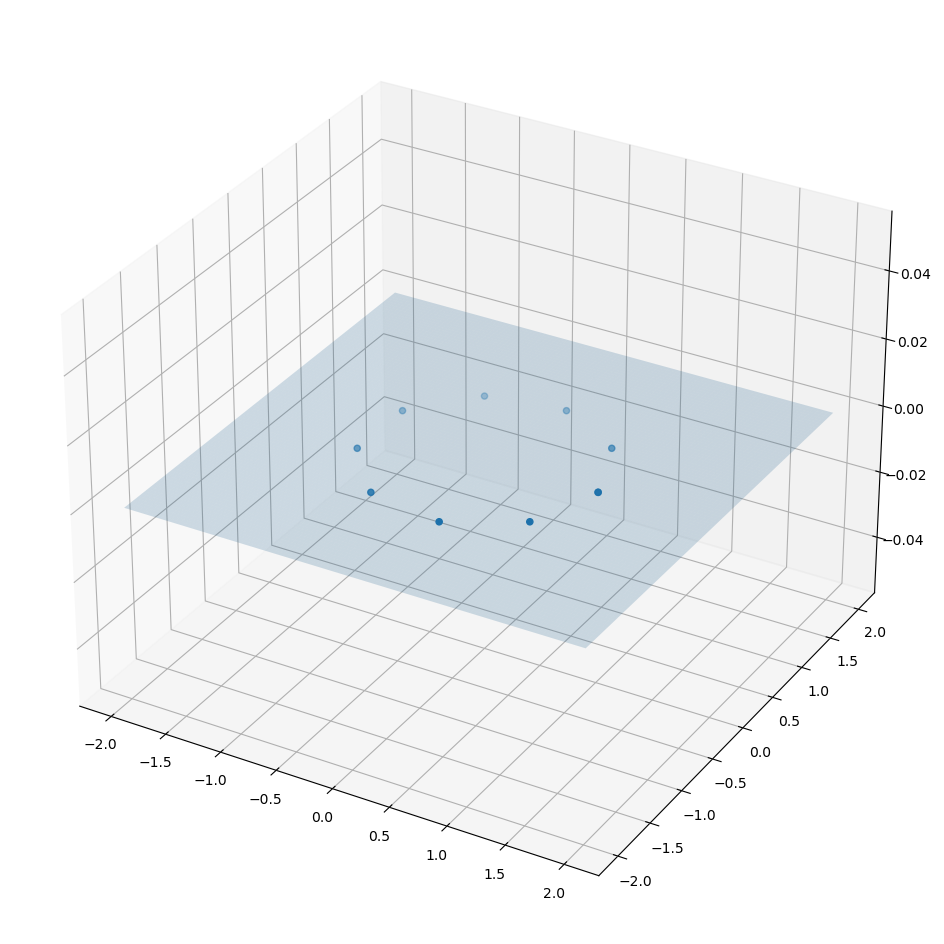

In [161]:
# Creating the theta and phi values.
N_points = 100

# Creating the coordinate grid for the unit sphere.
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1, X2 = jnp.meshgrid(x1, x2)
X3 = jnp.zeros_like(X1)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, intervals, intervals), 
                     X2.reshape(1, intervals, intervals), 
                     X3.reshape(1, intervals, intervals))), axes=(1,2,0))

N_points = 10
phi = jnp.linspace(0.0, jnp.pi*2, N_points)
X1_circle = jnp.cos(phi)
X2_circle = jnp.sin(phi)
X3_circle = jnp.zeros_like(phi)
X_circle = jnp.concatenate((X1_circle.reshape(1,-1), X2_circle.reshape(1,-1), X3_circle.reshape(1,-1))).T

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.scatter(X1_circle, X2_circle, X3_circle)
plt.show()

### Simulating Brownian Motion on Plane

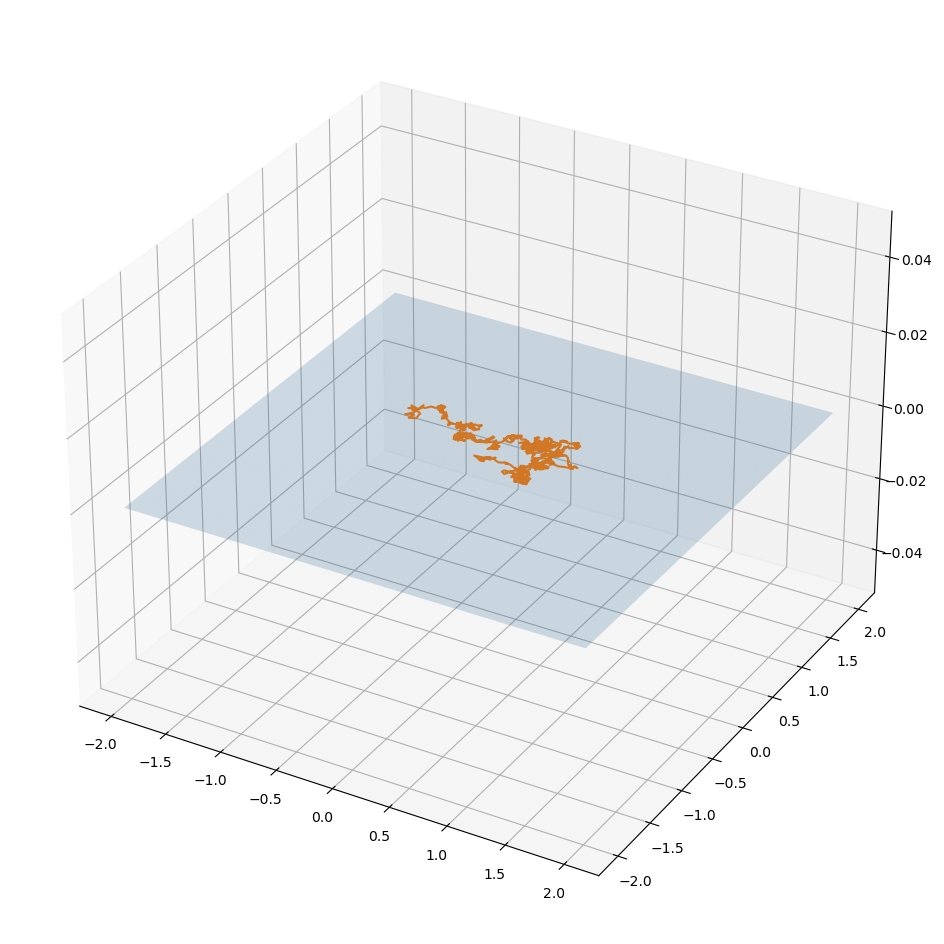

In [162]:
_dts = dts(T = T, n_steps=1000)
(ts,xs,charts) = M.Brownian_coords(x0,_dts,dWs(M.dim,_dts))

X_bm = (xs, charts)


# Creating the theta and phi values.
N_points = 100

# Creating the coordinate grid for the unit sphere.
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1, X2 = jnp.meshgrid(x1, x2)
X3 = jnp.zeros_like(X1)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, intervals, intervals), 
                     X2.reshape(1, intervals, intervals), 
                     X3.reshape(1, intervals, intervals))), axes=(1,2,0))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.plot(xs[:,0], xs[:,1], jnp.zeros(1000))
plt.show()

## Theoretical Heat Kernel on Plane

The heat kernel in $\mathbb{R}^{m}$ is given by

\begin{equation}
    p(x,y,t) = \frac{1}{(2\pi t)^{m/2}}e^{-\frac{-||x-y||^{2}}{2t}},
\end{equation}

which implies that

\begin{equation}
    \log p(x,y,t) = -\frac{||x-y||^{2}}{2t}-\frac{m}{2}\log\left(2\pi t\right)
\end{equation}

Thus

\begin{equation}
    \nabla_{x} \log p(x,y,t) = \frac{y-x}{t}
\end{equation}

In [166]:
def p_sm(x,y,t, m=3):
    
    const = (2*jnp.pi*t)**(m/2)
    
    return jnp.exp(-jnp.sum((x-y)**2)/(2*t))/const
    
def grad_log_p_sm(x,y,t):
    
    return -(y-x)/t

The following plot displays the heat kernel on the sphere

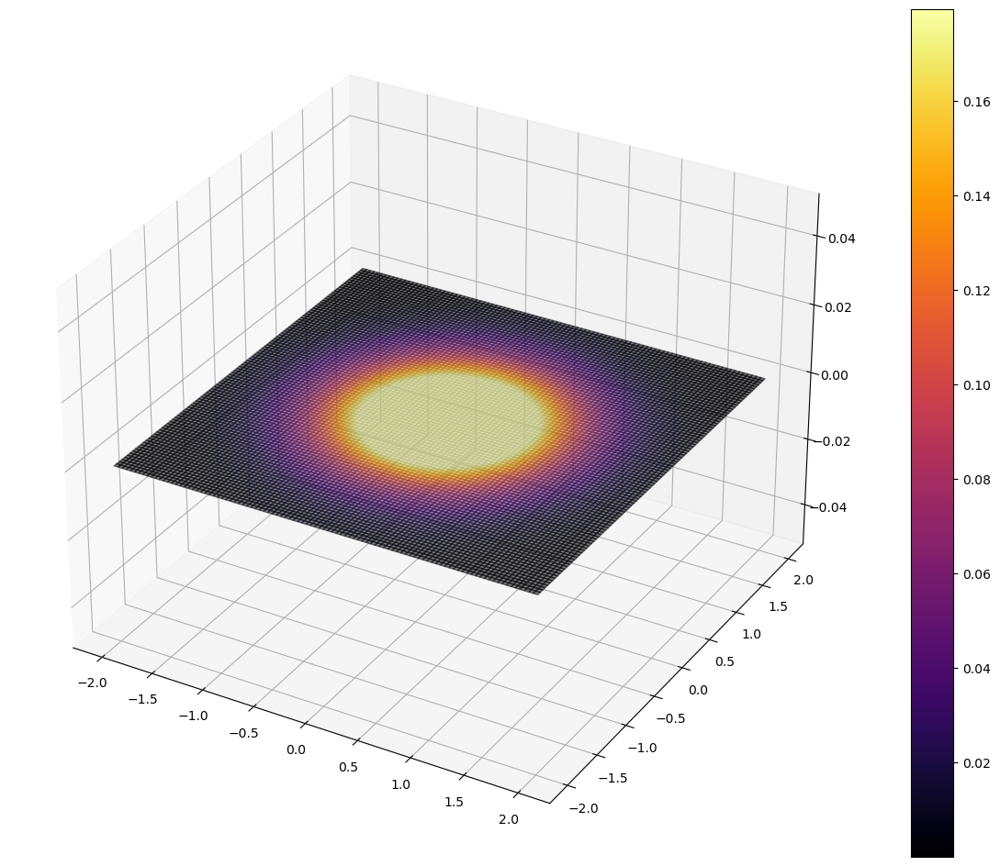

In [167]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

# Creating the theta and phi values.
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1, X2 = jnp.meshgrid(x1, x2)
X3 = jnp.zeros_like(X1)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, intervals, intervals), 
                     X2.reshape(1, intervals, intervals), 
                     X3.reshape(1, intervals, intervals))), axes=(1,2,0))

heat_map = vmap(lambda x2: vmap(lambda x1: p_sm(x0[-1], x1, T))(x2))(X)

# Creating the plot.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
plt.colorbar(m)

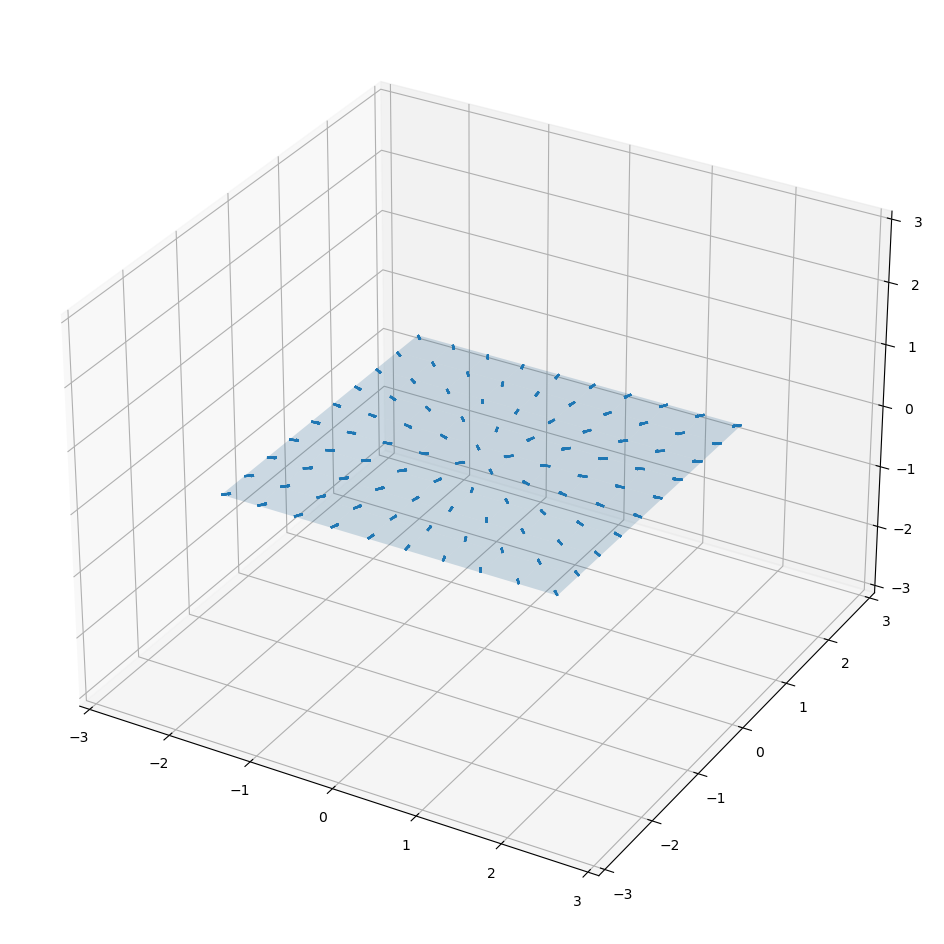

In [168]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: grad_log_p_sm(M.F(x0), x3, T))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

## Diffusion Mean

In [171]:
#%% Modules

import jax.numpy as jnp
from jax import vmap, jit, lax

#%% Code

def diffusion_mean(M, X_obs, gradlog_hk_fun, T = 1.0, eta = 0.1,
                   mu_init=None, _iter = 100):
    
    def get_coords(Fx):
        
        chart = M.centered_chart(Fx)
        
        return (M.invF((Fx,chart)),chart)
    
    def to_TM(Fx,v):
        x = get_coords(Fx)
        
        return jnp.dot(M.invJF((Fx,x[1])),v)
    
    def gradient_descent_step(mu, dummy):
        
        mu = M.Exp(mu, -eta*grad_error(mu))
        
        return mu, None
    
    if mu_init is None:
        mu_init = get_coords(X_obs[0])

    grad_error = jit(lambda mu: -jnp.sum(vmap(lambda y: gradlog_hk_fun(mu[0], y, T))(X_obs), axis=0))
    
    yT, _ = lax.scan(gradient_descent_step, mu_init, xs=jnp.arange(0, _iter, 1))
   
    return yT

In [172]:
test = diffusion_mean(M, X_circle[:,:2], grad_log_p_sm, T=T, eta = 0.1, mu_init = None, _iter=1000)

print(test)

(Array([nan, nan], dtype=float32), Array([0.], dtype=float32))


## Learning $\nabla_{x}\log p$ using theoretical gradient

Some text here

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$ and $T$

In [180]:
#Hyper parameters
learning_rate = 0.001
epochs = 100
batch_size = 2**5
samples_size = batch_size*2**4
maxiter = epochs * samples_size // batch_size

In [181]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""

        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)

        yield jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(batch_size).reshape(1,-1))).T


In [182]:
#Brownian generator
_dts = dts(T=T)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        (ts,xss,chartss,*_) = product(tile(x0,N),
                                      _dts,
                                      dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]

        yield vmap(lambda x,chart: M.F((x,chart)))(samples,charts)

In [186]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(10), jax.nn.tanh,
        hk.Linear(5), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jax.vmap(to_TM)(x.reshape([-1,M.emb_dim]),model(x.reshape([-1,M.emb_dim]))).reshape(x.shape)
    y = model(x)
    return y

In [187]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    true_s = vmap(lambda x1: to_TM(x1,grad_log_p_sm(x0[-1], x1, T)))(data)

    return jnp.linalg.norm(s-true_s)**2

In [188]:
#Data loader
#generator = generator_unif #Generate uniformly distirbuted numbers
generator = generator_bm #Generate from Browninan motion in x0
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate) #Adam Optimizer
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 171.783.
[Step 20], epoch 1, training loss: 197.051.
[Step 30], epoch 1, training loss: 109.041.
[Step 40], epoch 2, training loss: 105.156.
[Step 50], epoch 3, training loss: 124.218.
[Step 60], epoch 3, training loss: 157.971.
[Step 70], epoch 4, training loss: 104.937.
[Step 80], epoch 5, training loss: 86.282.
[Step 90], epoch 5, training loss: 100.333.
[Step 100], epoch 6, training loss: 112.937.
[Step 110], epoch 6, training loss: 105.704.
[Step 120], epoch 7, training loss: 92.993.
[Step 130], epoch 8, training loss: 88.882.
[Step 140], epoch 8, training loss: 105.735.
[Step 150], epoch 9, training loss: 73.983.
[Step 160], epoch 10, training loss: 85.123.
[Step 170], epoch 10, training loss: 59.405.
[Step 180], epoch 11, training loss: 52.506.
[Step 190], epoch 11, training loss: 52.088.
[Step 200], epoch 12, training loss: 58.890.
[Step 210], epoch 13, training loss: 51.519.
[Step 220], epoch 13, trainin

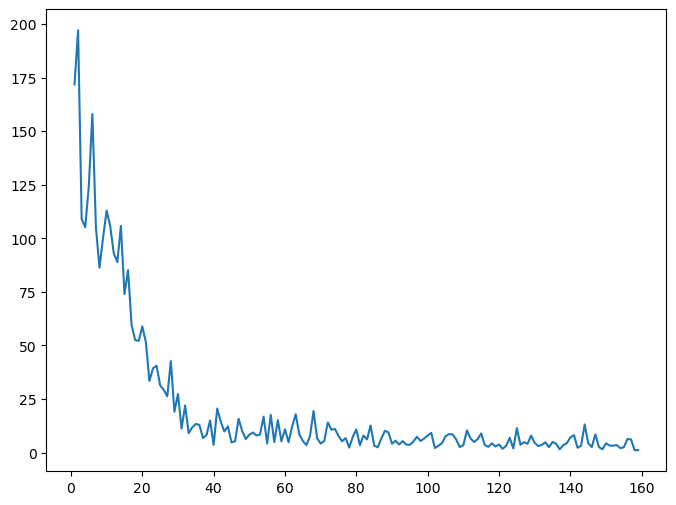

In [189]:
plt.figure(figsize=(8,6))
plt.plot(loss)

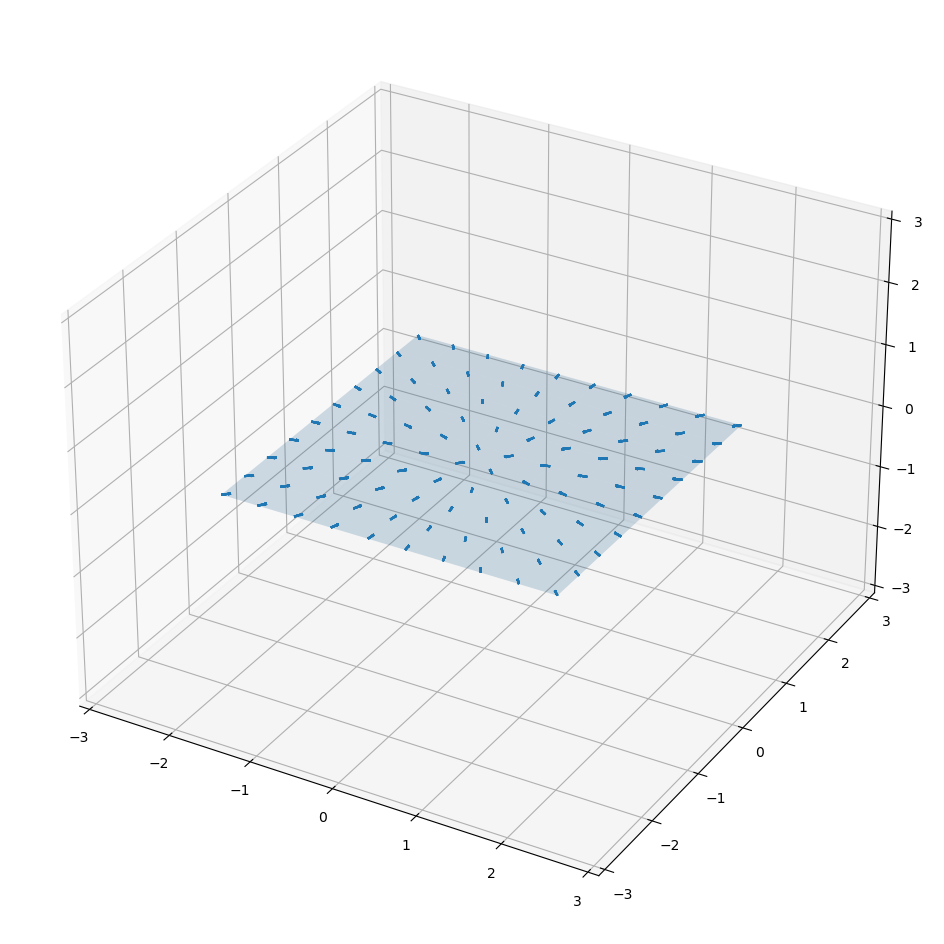

In [190]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, x3))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

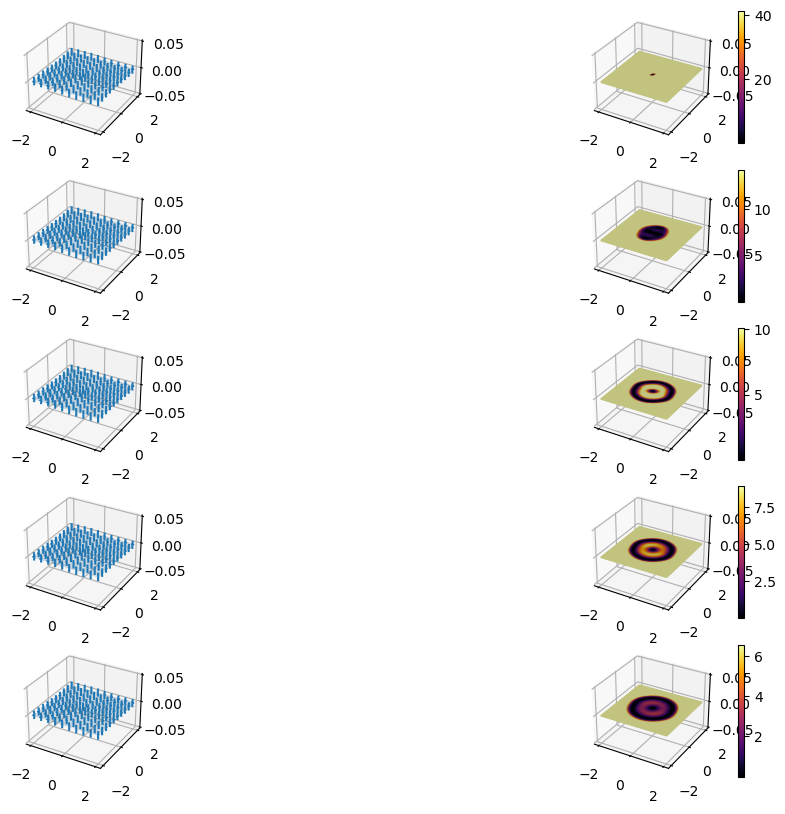

In [191]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],Fx)
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,Fx)
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $T$

In [195]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
repeats = 2**3
batch_size = samples_per_x0*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [196]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=repeats)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=repeats)
        
        x0 = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(repeats).reshape(1,-1))).T
        x0 = jnp.repeat(x0, samples_per_x0, axis=0)
        
        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(batch_size).reshape(1,-1))).T
        
        yield jnp.hstack((x0, xT))

In [197]:
global x0s
x0s = tile(x0,batch_size)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        _dts = dts(T=T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (jnp.repeat(samples[::samples_per_x0],samples_per_x0,axis=0),
               jnp.repeat(charts[::samples_per_x0],samples_per_x0,axis=0))
        yield jnp.hstack((Fx0s,
                          jax.vmap(lambda x,chart: M.F((x,chart)))(samples,charts)))

In [198]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(30), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jnp.squeeze(jax.vmap(to_TM)(x.reshape([-1,2*M.emb_dim])[:,M.emb_dim:],model(x.reshape([-1,2*M.emb_dim]))))
    y = model(x)
    return y

In [199]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x0, x1: to_TM(x1,grad_log_p_sm(x0, x1, T)))(Fx0s, Fxts)
    
    return jnp.linalg.norm(s-true_s)**2

In [200]:
generator = generator_unif
#generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 14342.892.
[Step 20], epoch 1, training loss: 16469.000.
[Step 30], epoch 1, training loss: 12629.284.
[Step 40], epoch 2, training loss: 11328.760.
[Step 50], epoch 3, training loss: 14825.028.
[Step 60], epoch 3, training loss: 7526.853.
[Step 70], epoch 4, training loss: 7545.025.
[Step 80], epoch 5, training loss: 10017.503.
[Step 90], epoch 5, training loss: 9876.060.
[Step 100], epoch 6, training loss: 11380.129.
[Step 110], epoch 6, training loss: 6149.337.
[Step 120], epoch 7, training loss: 6459.031.
[Step 130], epoch 8, training loss: 4985.957.
[Step 140], epoch 8, training loss: 6191.217.
[Step 150], epoch 9, training loss: 5563.354.
[Step 160], epoch 10, training loss: 3274.730.
[Step 170], epoch 10, training loss: 5917.136.
[Step 180], epoch 11, training loss: 3872.523.
[Step 190], epoch 11, training loss: 5020.539.
[Step 200], epoch 12, training loss: 2452.979.
[Step 210], epoch 13, training loss: 3

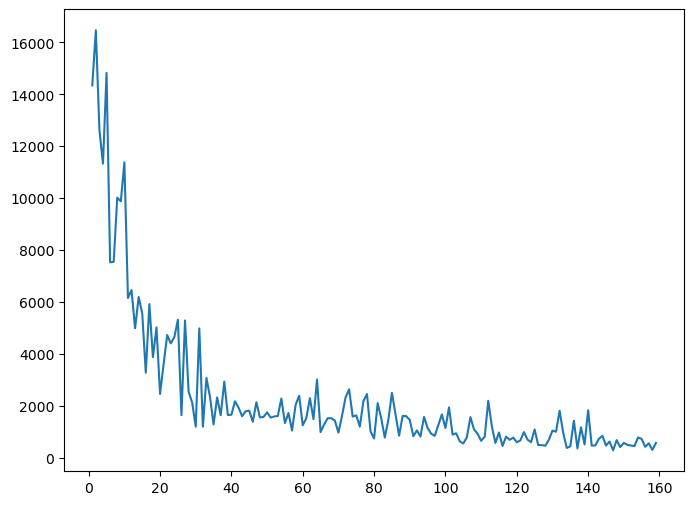

In [201]:
plt.figure(figsize=(8,6))
plt.plot(loss)

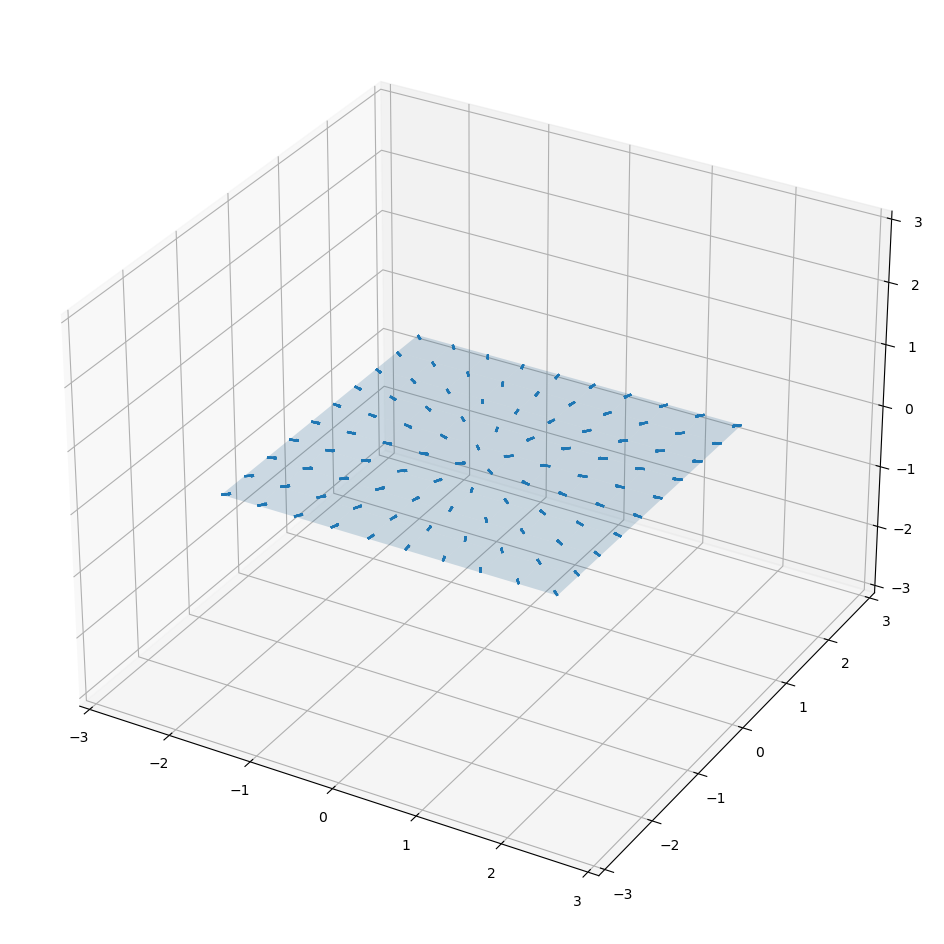

In [202]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((M.F(x0), x3))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

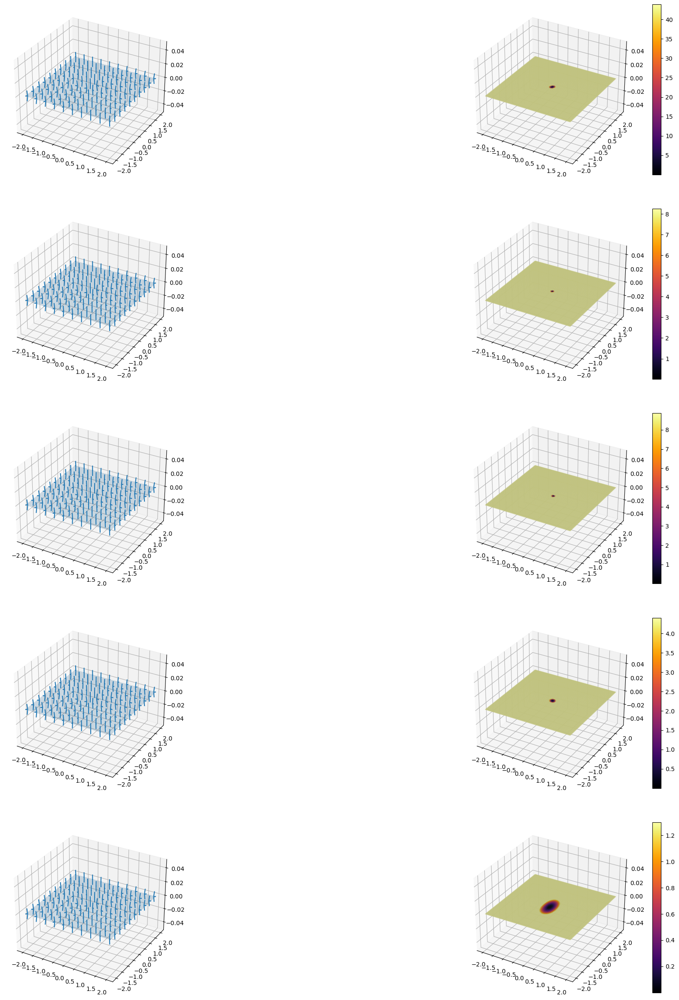

In [203]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0), x2))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((M.F(x0), Fx)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((M.F(x0), Fx)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$

In [225]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
ts_per_batch = 2**4
repeats = 2**5
batch_size = ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [226]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(batch_size).reshape(1,-1))).T
        t = np.repeat(np.random.uniform(low = 0.0, high = 1.0, size=ts_per_batch), repeats)
        
        yield jnp.hstack((xT, t.reshape(-1, 1)))

In [227]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = repeats
        _dts = dts(T=max_T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))        
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([49,99])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts.reshape((-1,1)),N,axis=1).reshape((-1,1))
                        ))

In [228]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(200), jax.nn.tanh,
        hk.Linear(100), jax.nn.tanh,
        hk.Linear(50), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    y = model(x)
    return y

In [229]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fxts = data[:,0:M.emb_dim]
    ts = data[:,-1]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x1, t: to_TM(x1,grad_log_p_sm(x0[-1], x1, t)))(Fxts, ts)
    
    return jnp.linalg.norm(s-true_s)**2

In [230]:
#generator = generator_unif
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 6208.022.
[Step 20], epoch 1, training loss: 1051.379.
[Step 30], epoch 1, training loss: 1393.020.
[Step 40], epoch 2, training loss: 6532.501.
[Step 50], epoch 3, training loss: 261.824.
[Step 60], epoch 3, training loss: 121.952.
[Step 70], epoch 4, training loss: 287.332.
[Step 80], epoch 5, training loss: 1158.374.
[Step 90], epoch 5, training loss: 1217.052.
[Step 100], epoch 6, training loss: 1186.682.
[Step 110], epoch 6, training loss: 4642.963.
[Step 120], epoch 7, training loss: 21.635.
[Step 130], epoch 8, training loss: 190.984.
[Step 140], epoch 8, training loss: 3382.062.
[Step 150], epoch 9, training loss: 48.628.
[Step 160], epoch 10, training loss: 46.644.
[Step 170], epoch 10, training loss: 26.928.
[Step 180], epoch 11, training loss: 3209.919.
[Step 190], epoch 11, training loss: 41.197.
[Step 200], epoch 12, training loss: 21.537.
[Step 210], epoch 13, training loss: 14.996.
[Step 220], epoc

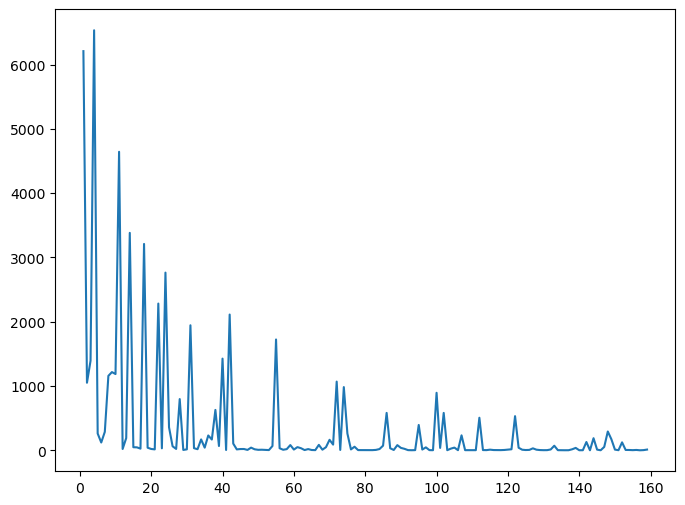

In [231]:
plt.figure(figsize=(8,6))
plt.plot(loss)

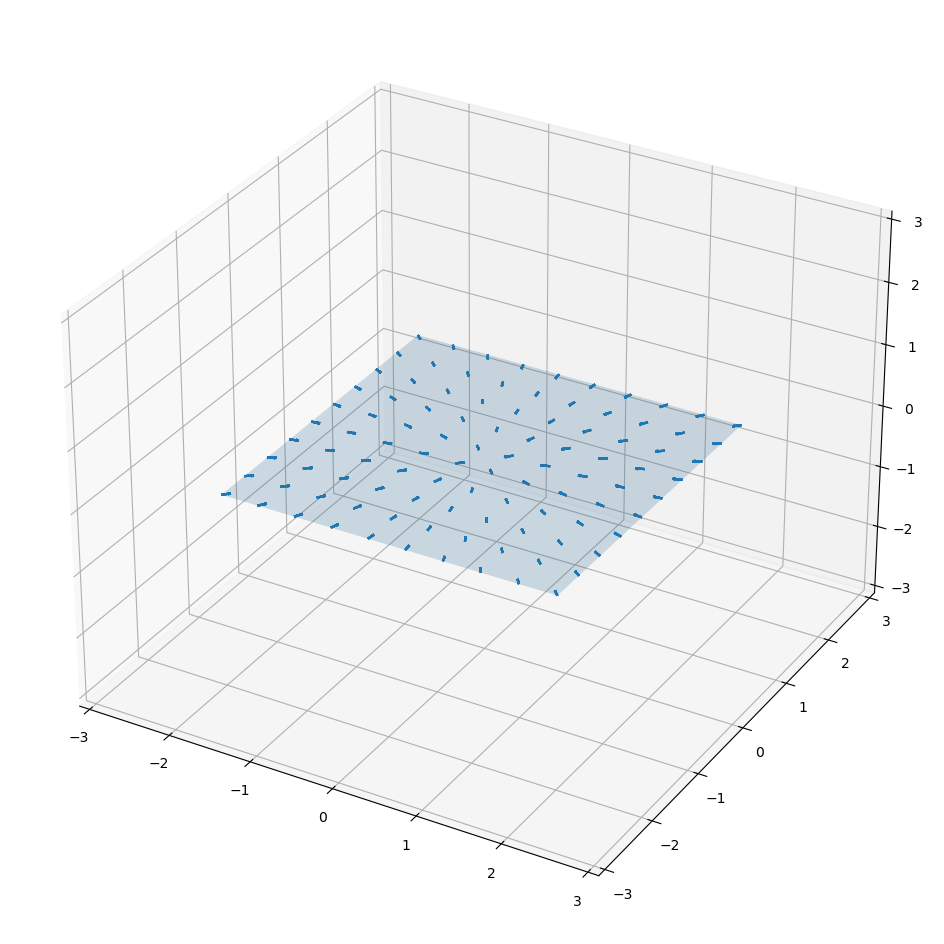

In [232]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((x3, T))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

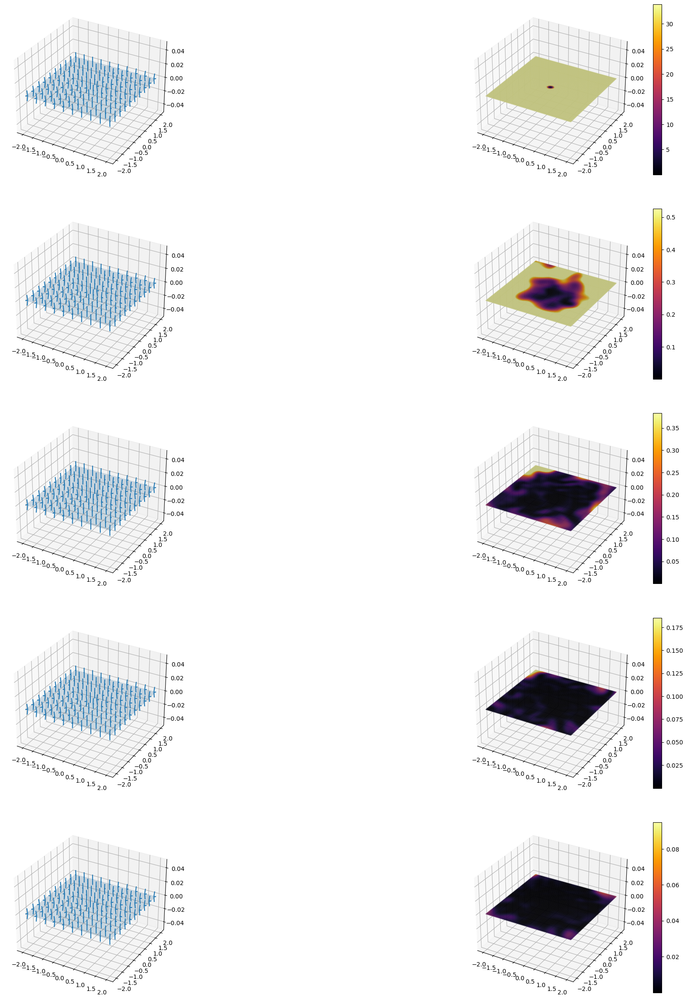

In [233]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((Fx, T)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((Fx, T)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ in general

In [247]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
ts_per_batch = 2**7
repeats = 2**3
batch_size = samples_per_x0*ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [248]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=repeats)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=repeats)
        
        x0 = jnp.repeat(jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(repeats).reshape(1,-1))).T,
                        ts_per_batch*samples_per_x0, axis=0)
        
        x1 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        x2 = np.random.normal(loc = 0.0, scale = 2.0, size=batch_size)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), jnp.zeros(batch_size).reshape(1,-1))).T
        t = np.repeat(np.random.uniform(low = 0.0, high = 1.0, size=ts_per_batch), repeats*samples_per_x0)
        
        yield jnp.hstack((x0, xT, t.reshape(-1, 1)))

In [249]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = samples_per_x0*repeats
        _dts = dts(T=max_T, n_steps=1000)
        global x0s
        (ts,xss,chartss,*_) = product((jnp.repeat(x0s[0],samples_per_x0,axis=0),jnp.repeat(x0s[1],samples_per_x0,axis=0)),
                                      _dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (xss[-1,::samples_per_x0],chartss[-1,::samples_per_x0])
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([-1,-1])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jnp.tile(jnp.repeat(Fx0s,samples_per_x0,axis=0),(ts_per_batch,1)),
                         jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts,N).reshape((-1,1))
                        ))

In [250]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(200), jax.nn.tanh,
        hk.Linear(100), jax.nn.tanh,
        hk.Linear(50), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    
    y = model(x)
    
    return y

In [251]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    ts = data[:,-1]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x0, x1, t: to_TM(x1,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    
    return jnp.linalg.norm(s-true_s)**2

In [252]:
#generator = generator_unif
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 237461.312.
[Step 20], epoch 1, training loss: 363477.625.
[Step 30], epoch 1, training loss: 475860.219.
[Step 40], epoch 2, training loss: 300896.500.
[Step 50], epoch 3, training loss: 514535.469.
[Step 60], epoch 3, training loss: 439107.875.
[Step 70], epoch 4, training loss: 213948.516.
[Step 80], epoch 5, training loss: 711409.250.
[Step 90], epoch 5, training loss: 185507.203.
[Step 100], epoch 6, training loss: 296629.094.
[Step 110], epoch 6, training loss: 257101.422.
[Step 120], epoch 7, training loss: 252459.266.
[Step 130], epoch 8, training loss: 550499.125.
[Step 140], epoch 8, training loss: 302560.281.
[Step 150], epoch 9, training loss: 148388.047.
[Step 160], epoch 10, training loss: 216734.609.
[Step 170], epoch 10, training loss: 305903.031.
[Step 180], epoch 11, training loss: 121453.781.
[Step 190], epoch 11, training loss: 489135.969.
[Step 200], epoch 12, training loss: 99974.609.
[Step 

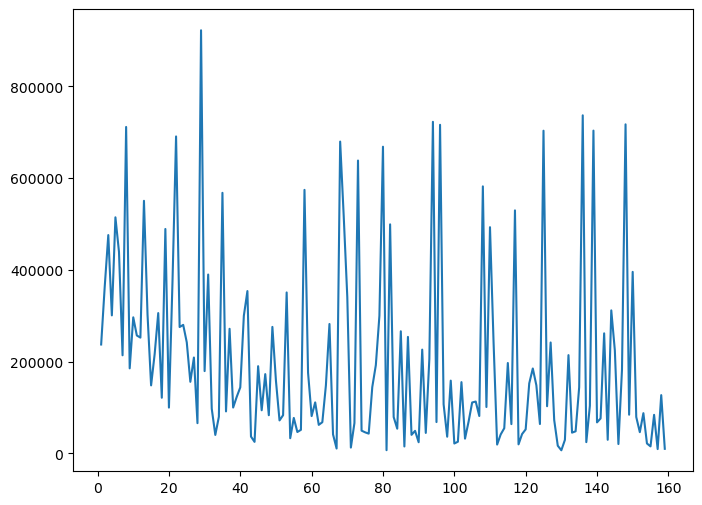

In [253]:
plt.figure(figsize=(8,6))
plt.plot(loss)

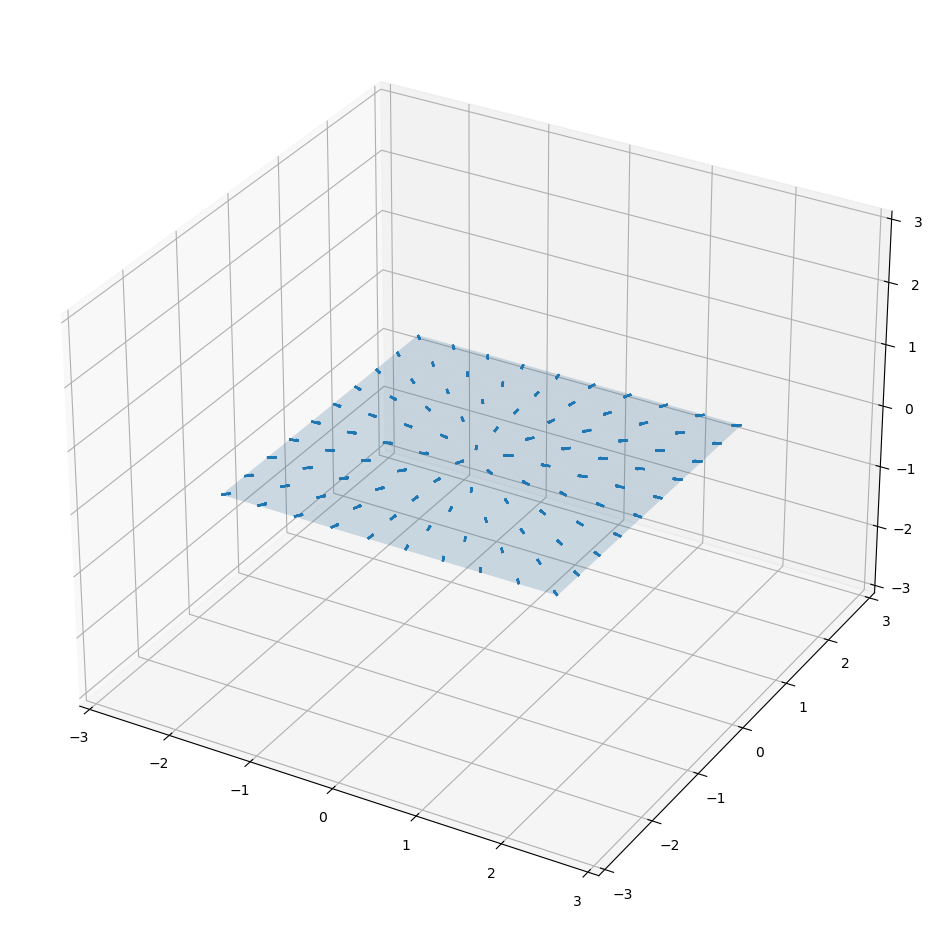

In [254]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((M.F(x0), x3, T))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

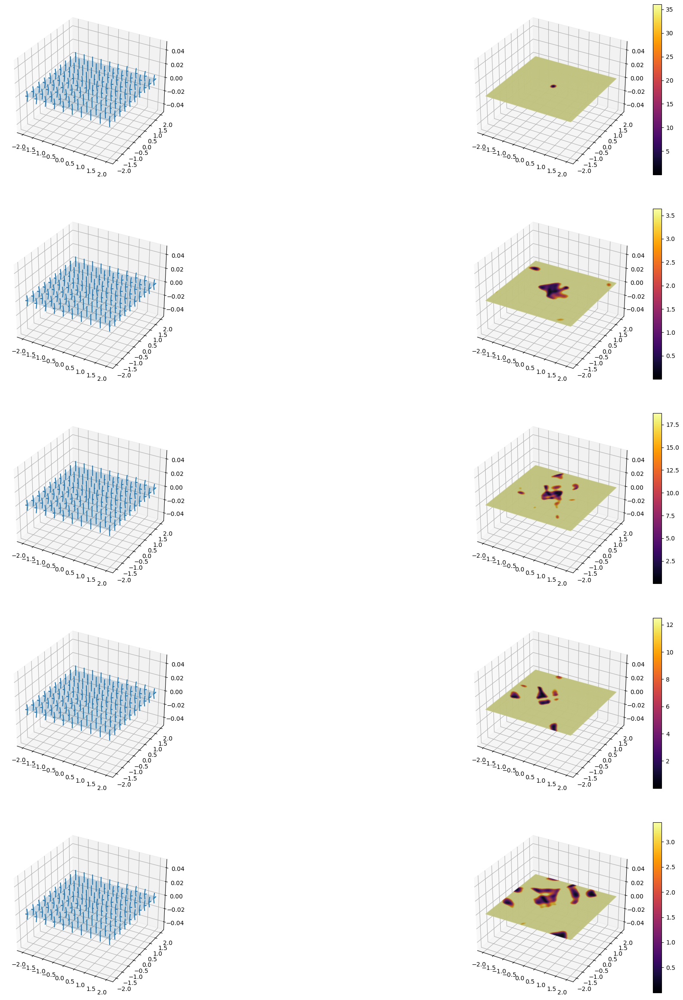

In [255]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0), x2, T))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((M.F(x0), Fx, T)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((M.F(x0), Fx, T)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

## Learning $\nabla_{x}\log p$

Following "Riemannian Score-Based Generative Modelling" by Bortoli et. al. it follows that

\begin{equation}
    \nabla_{x} \log p(x, y, t) = \int_{\mathcal{M}} \nabla_{x}p(x,y,t) \,\mathbb{P}_{s|t}(x_{t}, \,dx_{s}),
\end{equation}

can be minimized as

\begin{equation}
    \mathcal{l}_{t|s} = \int_{\mathcal{M}^{2}} ||\nabla_{x} \log p(x,y,t) - s_{\theta}(x,t)||,
\end{equation}

where $s_{\theta}$ is a neural network with parameters $\theta$. Using integration by parts it follows that

\begin{equation}
    \mathcal{l}_{t|s} = \int_{\mathcal{M}} \left(||s(x,t)||^{2} + 2\text{div}\left(s_{t}\right)(x_{t})\right)\,d\mathbb{P}_{t}(x_{t})+\int_{\mathcal{M}^{2}}||\nabla_{x}\log p_{t|s}(x_{t}|x_{s})\,d\mathbb{P}_{s,t}(x_{s},x_{t}),
\end{equation}

where the latter term is independent of $s_{\theta}$.

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$ and $T$

In [258]:
#Hyper parameters
learning_rate = 0.001
epochs = 100
batch_size = 2**5
samples_size = batch_size*2**4
maxiter = epochs * samples_size // batch_size

In [259]:
#Brownian generator
_dts = dts(T=T)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        (ts,xss,chartss,*_) = product(tile(x0,N),
                                      _dts,
                                      dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]

        yield vmap(lambda x,chart: M.F((x,chart)))(samples,charts)

In [260]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(10), jax.nn.tanh,
        hk.Linear(5), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jax.vmap(to_TM)(x.reshape([-1,M.emb_dim]),model(x.reshape([-1,M.emb_dim]))).reshape(x.shape)
    y = model(x)
    return y

In [261]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    (xs,charts) = jax.vmap(get_coords)(data)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda x,chart,s: M.div((x,chart),
                                            lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                net.apply(params,M.F(x))))
                   )(xs,charts,s)
#     # plot
#     newfig()
#     M.plot()
#     for i in range(xs.shape[0]):
#         M.plotx((xs[i],charts[i]))
#     plt.show()
    return jnp.mean(norm2s+2.0*divs)

In [262]:
#Data loader
generator = generator_bm #Generate from Browninan motion in x0
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate) #Adam Optimizer
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 0.629.
[Step 20], epoch 1, training loss: 0.413.
[Step 30], epoch 1, training loss: 0.258.
[Step 40], epoch 2, training loss: 0.082.
[Step 50], epoch 3, training loss: -0.089.
[Step 60], epoch 3, training loss: -0.287.
[Step 70], epoch 4, training loss: -0.472.
[Step 80], epoch 5, training loss: -0.759.
[Step 90], epoch 5, training loss: -1.037.
[Step 100], epoch 6, training loss: -1.081.
[Step 110], epoch 6, training loss: -1.433.
[Step 120], epoch 7, training loss: -1.082.
[Step 130], epoch 8, training loss: -1.606.
[Step 140], epoch 8, training loss: -1.702.
[Step 150], epoch 9, training loss: -1.842.
[Step 160], epoch 10, training loss: -1.826.
[Step 170], epoch 10, training loss: -2.143.
[Step 180], epoch 11, training loss: -2.649.
[Step 190], epoch 11, training loss: -2.524.
[Step 200], epoch 12, training loss: -2.686.
[Step 210], epoch 13, training loss: -2.834.
[Step 220], epoch 13, training loss: -2.473.

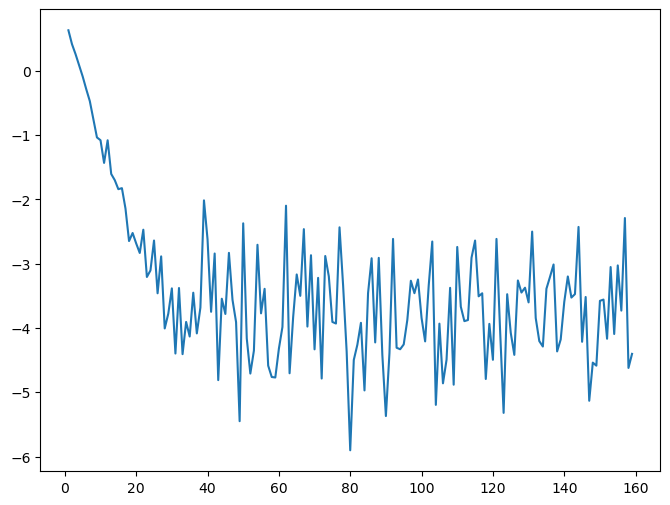

In [263]:
plt.figure(figsize=(8,6))
plt.plot(loss)

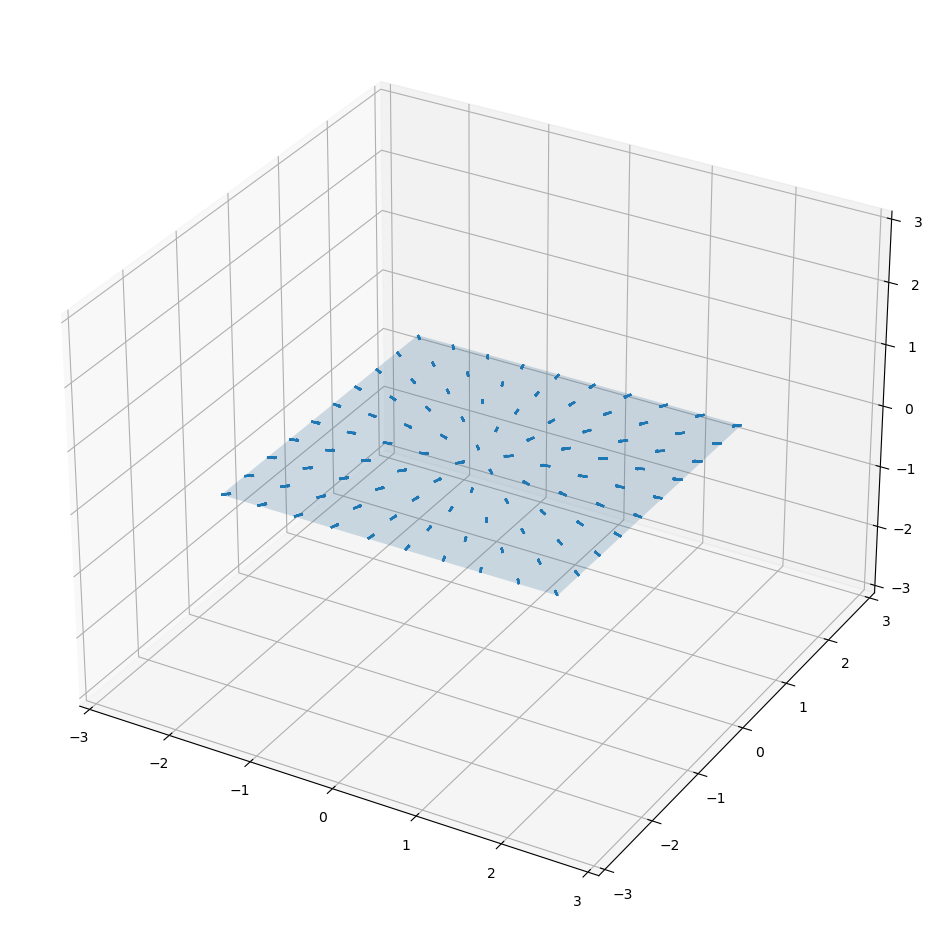

In [264]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, x3))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

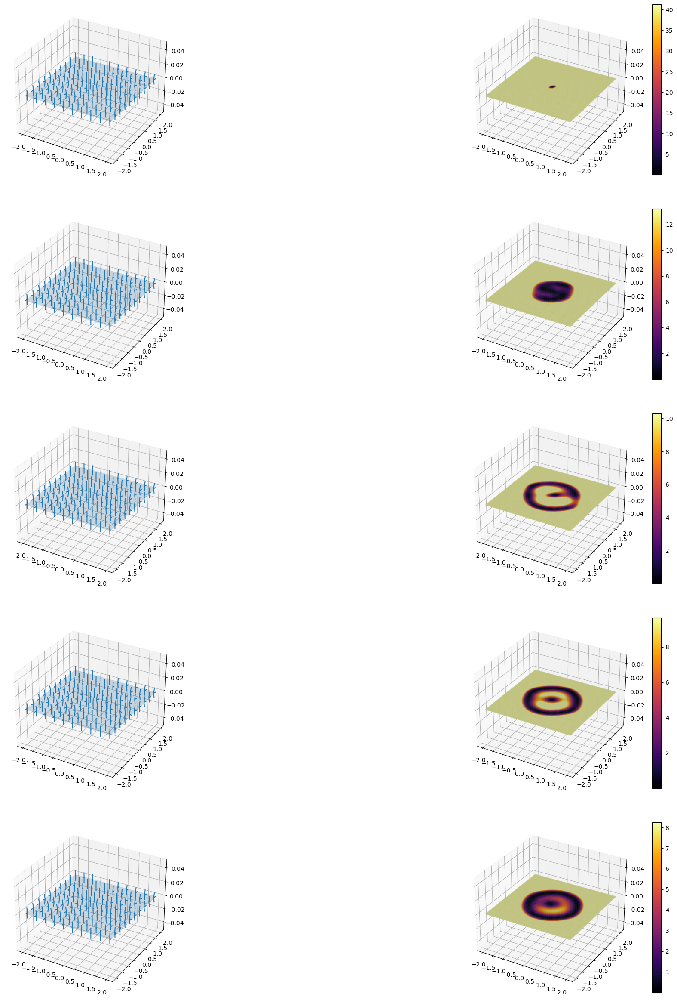

In [265]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],Fx)
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,Fx)
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $T$

In [268]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
repeats = 2**3
batch_size = samples_per_x0*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [269]:
global x0s
x0s = tile(x0,batch_size)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        _dts = dts(T=T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (jnp.repeat(samples[::samples_per_x0],samples_per_x0,axis=0),
               jnp.repeat(charts[::samples_per_x0],samples_per_x0,axis=0))
        yield jnp.hstack((Fx0s,
                          jax.vmap(lambda x,chart: M.F((x,chart)))(samples,charts)))

In [270]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(80), jax.nn.tanh,
        hk.Linear(40), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jnp.squeeze(jax.vmap(to_TM)(x.reshape([-1,2*M.emb_dim])[:,M.emb_dim:],model(x.reshape([-1,2*M.emb_dim]))))
    y = model(x)
    return y

In [271]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda Fx0,xt,chartt: M.div((xt,chartt),
                                                lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                  net.apply(params,jnp.hstack((Fx0,M.F(x))))))
                   )(Fx0s,xts,chartts)
    return jnp.mean(norm2s+2.0*divs)

In [272]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -0.884.
[Step 20], epoch 1, training loss: -1.420.
[Step 30], epoch 1, training loss: -2.289.
[Step 40], epoch 2, training loss: -2.672.
[Step 50], epoch 3, training loss: -2.890.
[Step 60], epoch 3, training loss: -3.005.
[Step 70], epoch 4, training loss: -3.219.
[Step 80], epoch 5, training loss: -3.453.
[Step 90], epoch 5, training loss: -3.426.
[Step 100], epoch 6, training loss: -3.355.
[Step 110], epoch 6, training loss: -3.443.
[Step 120], epoch 7, training loss: -3.894.
[Step 130], epoch 8, training loss: -3.486.
[Step 140], epoch 8, training loss: -4.064.
[Step 150], epoch 9, training loss: -3.508.
[Step 160], epoch 10, training loss: -3.869.
[Step 170], epoch 10, training loss: -3.666.
[Step 180], epoch 11, training loss: -3.529.
[Step 190], epoch 11, training loss: -3.706.
[Step 200], epoch 12, training loss: -3.527.
[Step 210], epoch 13, training loss: -3.750.
[Step 220], epoch 13, training loss: -3.

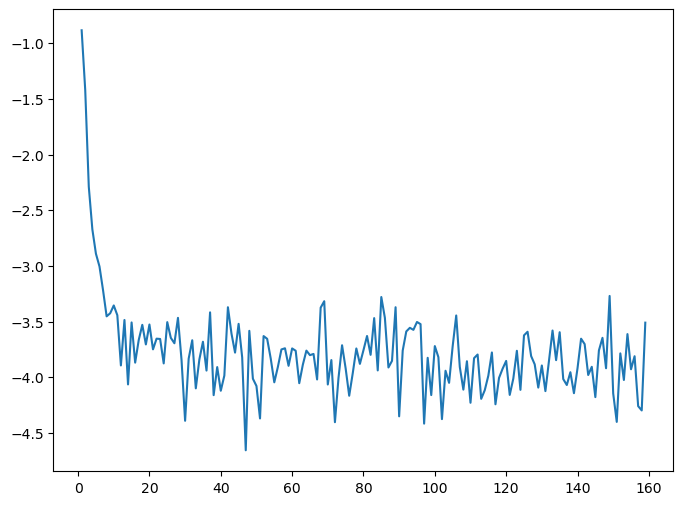

In [273]:
plt.figure(figsize=(8,6))
plt.plot(loss)

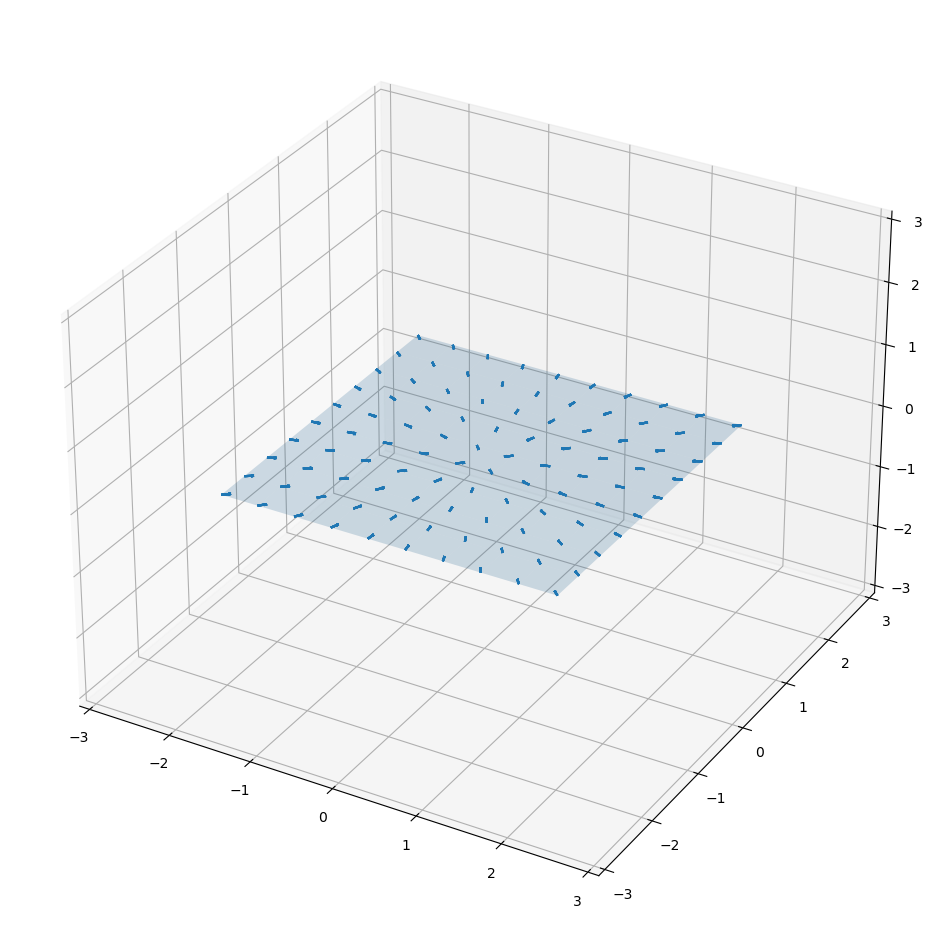

In [274]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((M.F(x0), x3))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

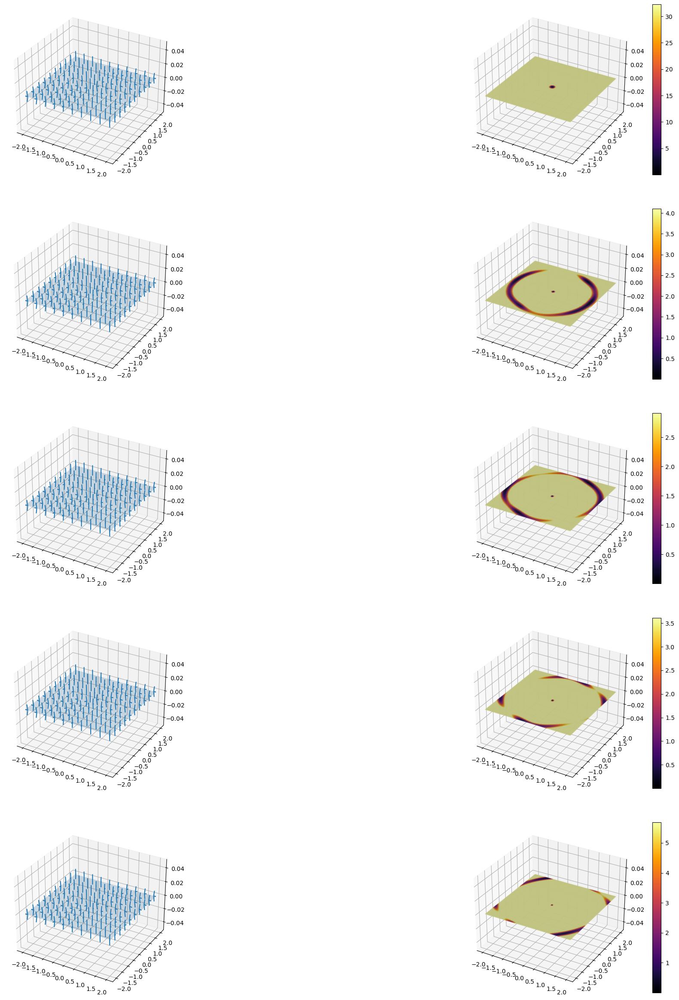

In [275]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0), x2))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((M.F(x0), Fx)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((M.F(x0), Fx)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$

In [281]:
learning_rate = 0.001 # Learning rate for optimizer
epochs = 50 # Number of passes over the dataset
ts_per_batch = 2**4
repeats = 2**5
batch_size = ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch

In [282]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = repeats
        _dts = dts(T=max_T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))        
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([49,99])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts.reshape((-1,1)),N,axis=1).reshape((-1,1))
                        ))

In [283]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(30), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    y = model(x)
    return y

In [284]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fxts = data[:,0:M.emb_dim]
    ts = data[:,-1]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda xt,chartt,t: M.div((xt,chartt),
                                              lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                net.apply(params,jnp.hstack((M.F(x),t)))))
                   )(xts,chartts,ts)
    return jnp.mean(norm2s+2.0*divs)

In [285]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -1.066.
[Step 20], epoch 1, training loss: -1.845.
[Step 30], epoch 1, training loss: -2.660.
[Step 40], epoch 2, training loss: -4.024.
[Step 50], epoch 3, training loss: -3.778.
[Step 60], epoch 3, training loss: -4.819.
[Step 70], epoch 4, training loss: -5.012.
[Step 80], epoch 5, training loss: -3.690.
[Step 90], epoch 5, training loss: -4.218.
[Step 100], epoch 6, training loss: -6.234.
[Step 110], epoch 6, training loss: -5.525.
[Step 120], epoch 7, training loss: -3.073.
[Step 130], epoch 8, training loss: -6.238.
[Step 140], epoch 8, training loss: -5.385.
[Step 150], epoch 9, training loss: -5.931.
[Step 160], epoch 10, training loss: -5.716.
[Step 170], epoch 10, training loss: -4.074.
[Step 180], epoch 11, training loss: -4.070.
[Step 190], epoch 11, training loss: -3.655.
[Step 200], epoch 12, training loss: -4.020.
[Step 210], epoch 13, training loss: -4.504.
[Step 220], epoch 13, training loss: -4.

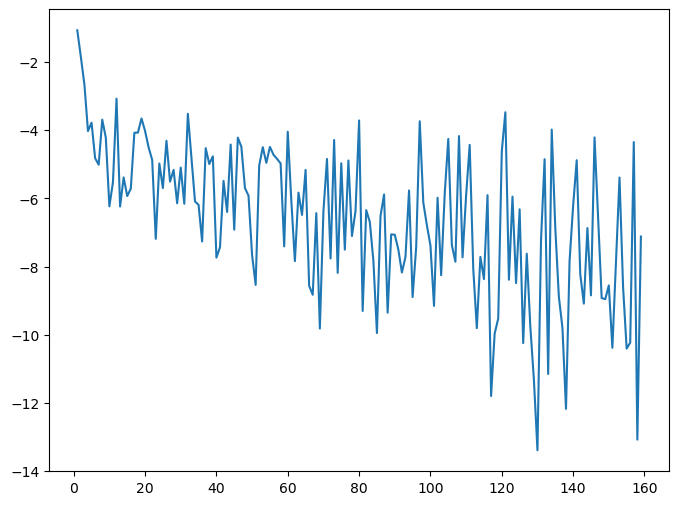

In [286]:
plt.figure(figsize=(8,6))
plt.plot(loss)

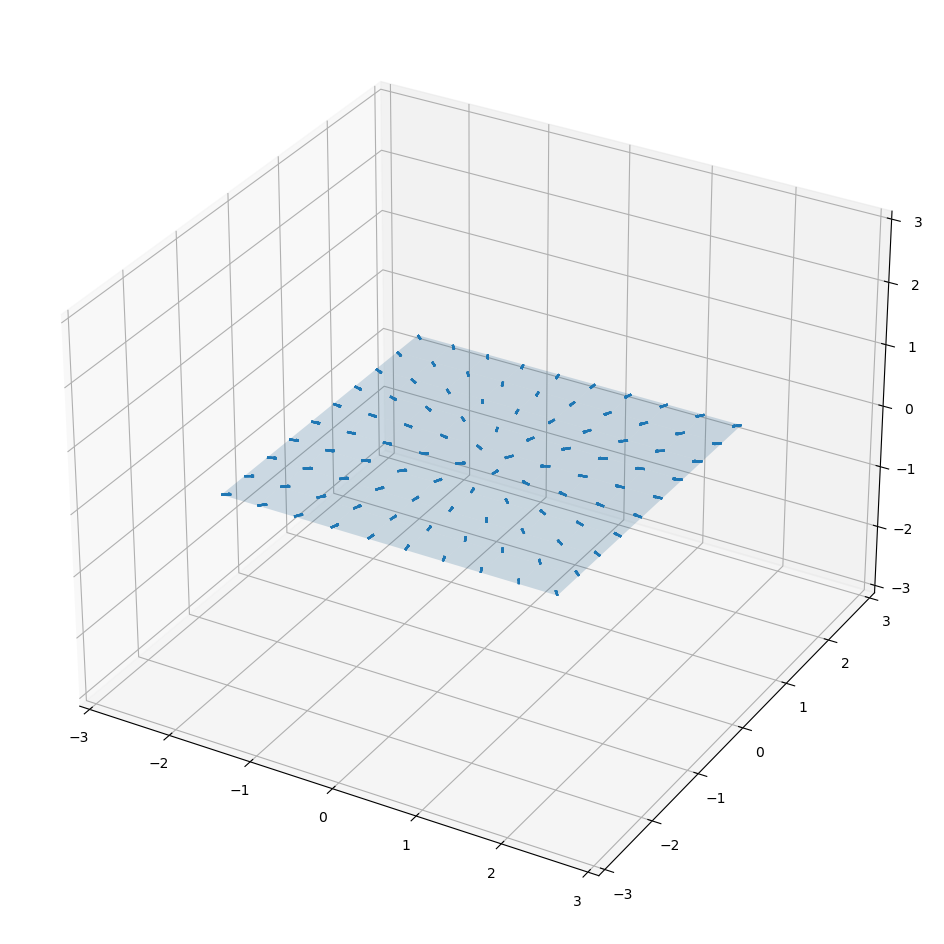

In [287]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((x3, T))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

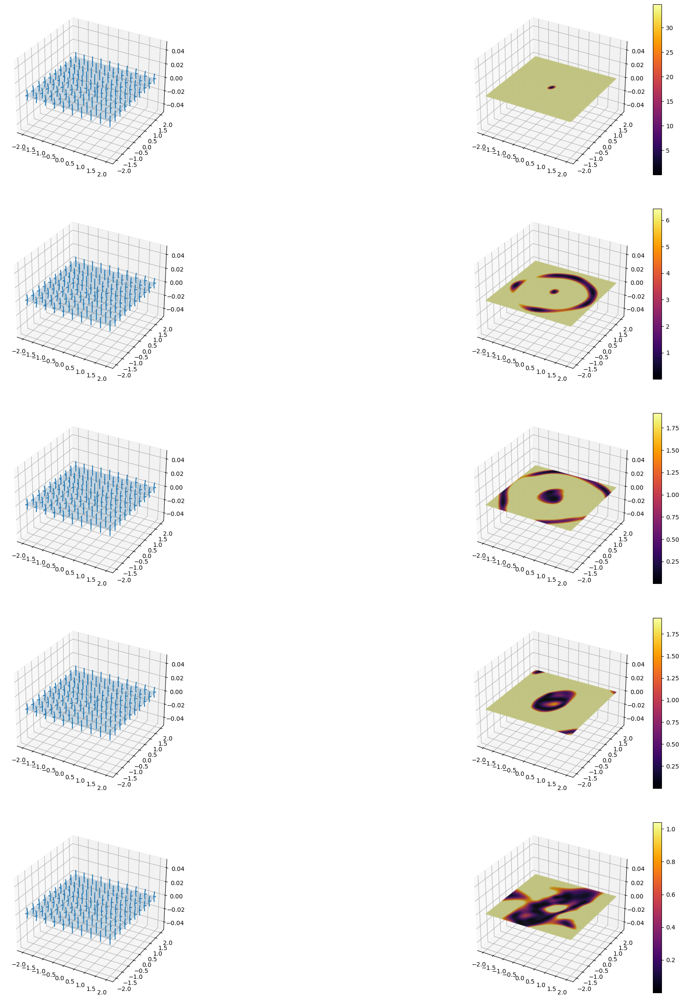

In [288]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((Fx, T)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((Fx, T)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ in general

In [317]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
ts_per_batch = 2**7
repeats = 2**3
batch_size = samples_per_x0*ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [318]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = samples_per_x0*repeats
        _dts = dts(T=max_T, n_steps=1000)
        global x0s
        (ts,xss,chartss,*_) = product((jnp.repeat(x0s[0],samples_per_x0,axis=0),jnp.repeat(x0s[1],samples_per_x0,axis=0)),
                                      _dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (xss[-1,::samples_per_x0],chartss[-1,::samples_per_x0])
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([-1,-1])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jnp.tile(jnp.repeat(Fx0s,samples_per_x0,axis=0),(ts_per_batch,1)),
                         jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts,N).reshape((-1,1))
                        ))

In [319]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(100), jax.nn.tanh,
        hk.Linear(60), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    
    y = model(x)
    
    return y

In [320]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    ts = data[:,-1]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda Fx0,xt,chartt,t: M.div((xt,chartt),
                                                  lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                    net.apply(params,jnp.hstack((Fx0,M.F(x),t)))))
                   )(Fx0s,xts,chartts,ts)
    return jnp.mean(norm2s+2.0*divs)

In [321]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -0.710.
[Step 20], epoch 1, training loss: -1.242.
[Step 30], epoch 1, training loss: -1.663.
[Step 40], epoch 2, training loss: -2.298.
[Step 50], epoch 3, training loss: -2.712.
[Step 60], epoch 3, training loss: -3.010.
[Step 70], epoch 4, training loss: -3.250.
[Step 80], epoch 5, training loss: -3.251.
[Step 90], epoch 5, training loss: -4.444.
[Step 100], epoch 6, training loss: -4.432.
[Step 110], epoch 6, training loss: -4.357.
[Step 120], epoch 7, training loss: -4.159.
[Step 130], epoch 8, training loss: -3.794.
[Step 140], epoch 8, training loss: -4.391.
[Step 150], epoch 9, training loss: -4.167.
[Step 160], epoch 10, training loss: -4.265.
[Step 170], epoch 10, training loss: -4.567.
[Step 180], epoch 11, training loss: -4.775.
[Step 190], epoch 11, training loss: -5.214.
[Step 200], epoch 12, training loss: -3.877.
[Step 210], epoch 13, training loss: -4.627.
[Step 220], epoch 13, training loss: -4.

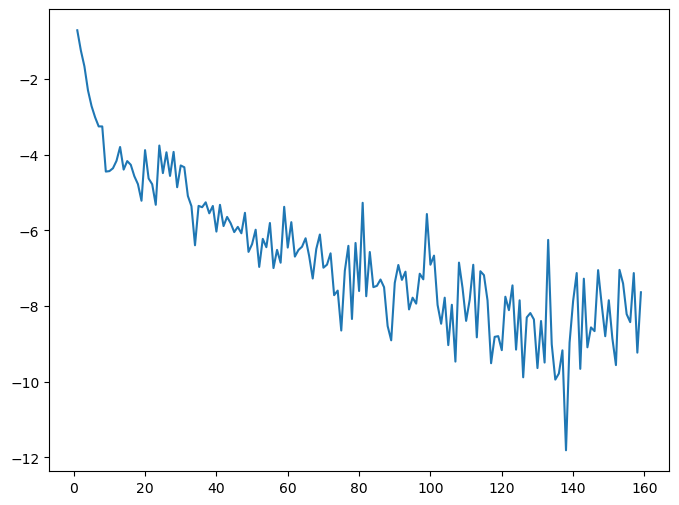

In [325]:
plt.figure(figsize=(8,6))
plt.plot(loss)

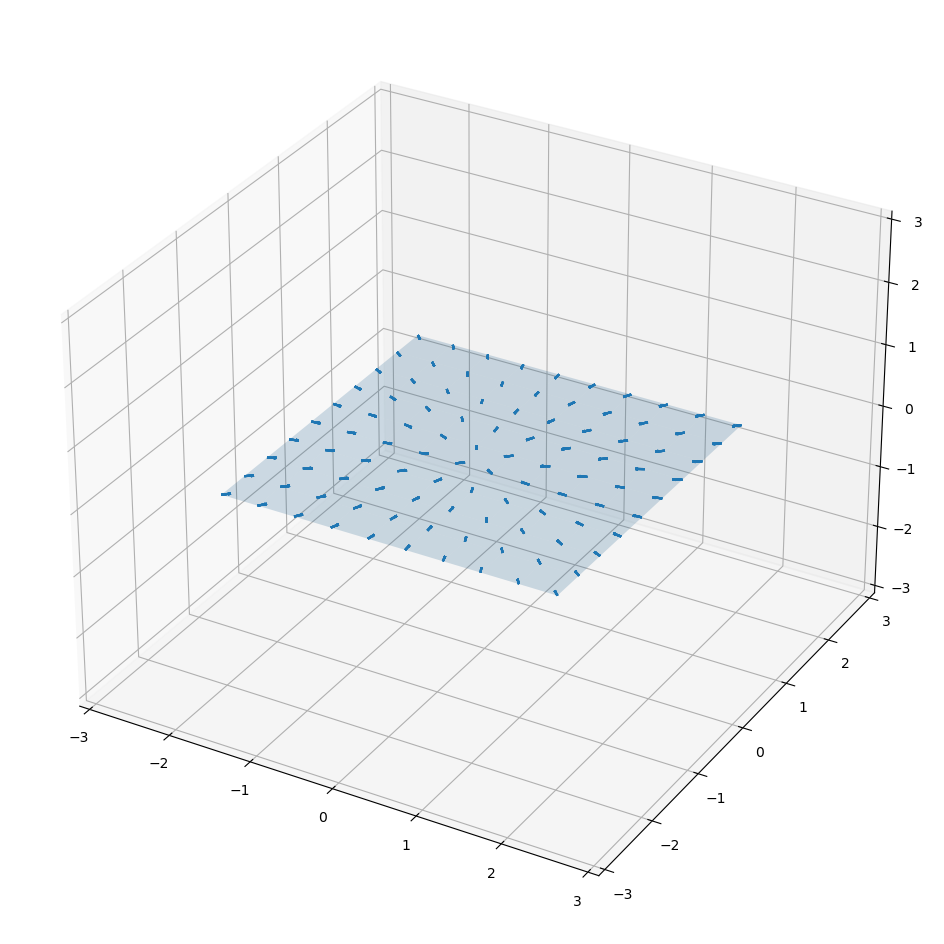

In [326]:
#define grid
lbnd = -2.0
ubnd = 2.0
N_points = 10
x1 = jnp.linspace(lbnd, ubnd, N_points)
x2 = jnp.linspace(lbnd, ubnd, N_points)
x3 = jnp.zeros(N_points)
X1, X2, X3 = jnp.meshgrid(x1, x2, x3)
X = jnp.transpose(jnp.concatenate((X1.reshape(1, N_points, N_points, N_points), 
                     X2.reshape(1, N_points, N_points, N_points), 
                     X3.reshape(1, N_points, N_points, N_points))), axes=(1,2,3,0))

grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, jnp.hstack((M.F(x0), x3, T))))(x2))(x1))(X)

# Creating the coordinate grid for the unit sphere.
X1_surface, X2_surface = jnp.meshgrid(x1, x2)
X3_surface = jnp.zeros_like(X1_surface)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1_surface, X2_surface, X3_surface, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,:,0], grad_log[:,:,:,1], grad_log[:,:,:,2], length=0.1, normalize=True)
ax.set_xlim([-3.0, 3.0])
ax.set_ylim([-3.0, 3.0])
ax.set_zlim([-3.0, 3.0])
plt.show()

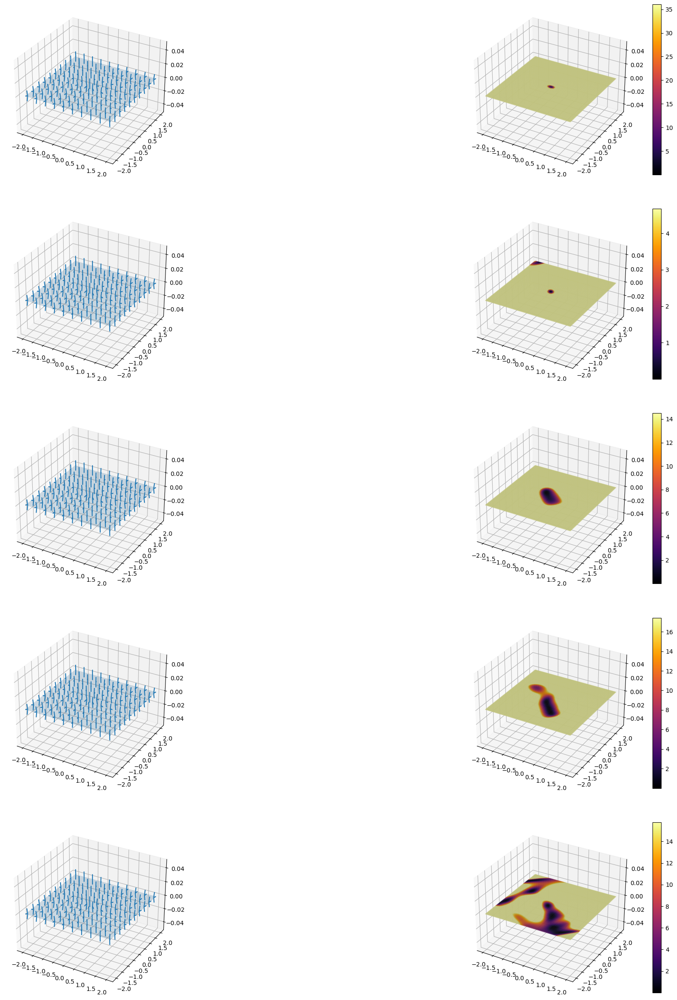

In [327]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_vec, X2_vec = jnp.meshgrid(x1, x2)
X3_vec = jnp.zeros_like(X1_vec)
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, intervals, intervals), 
                     X2_vec.reshape(1, intervals, intervals), 
                     X3_vec.reshape(1, intervals, intervals))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0), x2, T))))(x1))(X_vec)

# Creating the theta and phi values
intervals = 100

x1 = jnp.linspace(-2.0, 2.0, intervals)
x2 = jnp.linspace(-2.0, 2.0, intervals)
x3 = jnp.zeros(intervals)

# Creating the coordinate grid for the unit sphere.
X1_heat, X2_heat = jnp.meshgrid(x1, x2)
X3_heat = jnp.zeros_like(X1_heat)
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, intervals, intervals), 
                     X2_heat.reshape(1, intervals, intervals), 
                     X3_heat.reshape(1, intervals, intervals))), axes=(1,2,0))

theoretical_grad = lambda Fx: grad_log_p_sm(x0[-1], Fx, T)

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(24,36))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: net.apply(params_lst[i*frac],jnp.hstack((M.F(x0), Fx, T)))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 2, 2*i+2, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: net.apply(params,jnp.hstack((M.F(x0), Fx, T)))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 2, 2*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

## Appendix